# Demo for page splitting

In [1]:
from ecpo_eynollah import split_pages as sp
from PIL import Image, ImageDraw, ImageFont
from pathlib import Path
import ruptures as rpt

In [2]:
# helper function to display images
def display_image(in_dir: Path, out_dir: Path):
    font = ImageFont.load_default()

    for img_file in in_dir.iterdir():
        if img_file.suffix.lower() not in [".png", ".jpg", ".jpeg", ".tiff", ".bmp"]:
            continue
        
        input_image = Image.open(img_file)
        images = [input_image]
        
        base_name = img_file.stem
        output_files = list(out_dir.glob(f"{base_name}_p*_*.jpg"))
        output_files.sort()
        images += [Image.open(f) for f in output_files]
        
        # Prepare scaled images with text overlays
        scaled_images = []
        for img, label in zip(images, [img_file.name] + [f.name for f in output_files]):
            w, h = img.size
            w, h = int(w * 0.2), int(h * 0.2)
            img_resized = img.resize((w, h))
            
            # Draw text overlay
            base = img_resized.convert("RGBA")
            overlay = Image.new("RGBA", base.size, (255, 255, 255, 0))
            draw = ImageDraw.Draw(overlay)
            bbox = draw.textbbox((0, 0), label, font=font)  # (left, top, right, bottom)
            text_w = bbox[2] - bbox[0]
            text_h = bbox[3] - bbox[1]
            padding = 5
            # Draw semi-transparent rectangle behind text
            draw.rectangle(
                [(0, 0), (text_w + padding*2, text_h + padding*2)],
                fill=(0, 0, 0, 127)
            )
            # Draw text on top
            draw.text((padding, padding), label, fill=(255, 255, 255), font=font)

            overlayed_img = Image.alpha_composite(base, overlay).convert("RGB")
            
            scaled_images.append(overlayed_img)
        
        # Compute dimensions for stacking vertically
        max_width = max(img.width for img in scaled_images)
        total_height = sum(img.height for img in scaled_images) + 10 * (len(scaled_images) - 1)  # 10 pixels gap between images
        
        # Create a new blank image
        combined = Image.new('RGB', (max_width, total_height), color=0)
        
        # Paste images side by side
        x_offset = 0
        y_offset = 0
        for img in scaled_images:
            combined.paste(img, (x_offset, y_offset))
            y_offset += img.height + 10  # 10 pixels gap between images
        
        display(combined)

The images need to be divided into two or three pages, depending on their content. Automatically determining the correct number of splits is challenging, so we currently rely on a configuration parameter to specify the number of segments.

## Two-segment images

In [ ]:
# input and output folders
in_dir_2segs = Path("../../data/in/sample/2-segs")
out_dir_2segs = Path("../../data/out/pagesplit/2-segs")

In [4]:
# use default config but modify input and output dirs
# default config is in ecpo_eynollah/config/default_config.json
new_config = {
    "input_dir": str(in_dir_2segs),
    "gutter_detection": {
        "output_dir": str(out_dir_2segs),
        "num_segments": 2,
    },
}

In [5]:
# split pages in the input folder and save to the output folder
debug_info_2segs = sp.process_folder(config_path="default", new_config=new_config, unique_tag="notebook-1112")

The config have been saved to ../../data/out/pagesplit/2-segs/used_config_notebook-1112.json


files:   0%|          | 0/3 [00:00<?, ?it/s]Model files already exist. Using cached files. To redownload, please delete the directory manually: `/home/tuyen/.paddlex/official_models/PP-OCRv5_server_det`.
/home/tuyen/anaconda3/envs/ecpo/lib/python3.13/site-packages/paddle/utils/cpp_extension/extension_utils.py:717: UserWarning: No ccache found. Please be aware that recompiling all source files may be required. You can download and install ccache from: https://github.com/ccache/ccache/blob/master/doc/INSTALL.md
  warnings.warn(warning_message)
files: 100%|██████████| 3/3 [00:20<00:00,  6.90s/it]

Processed 3 files.
Output saved to: ../../data/out/pagesplit/2-segs
Fallback to center split used in 0 files.


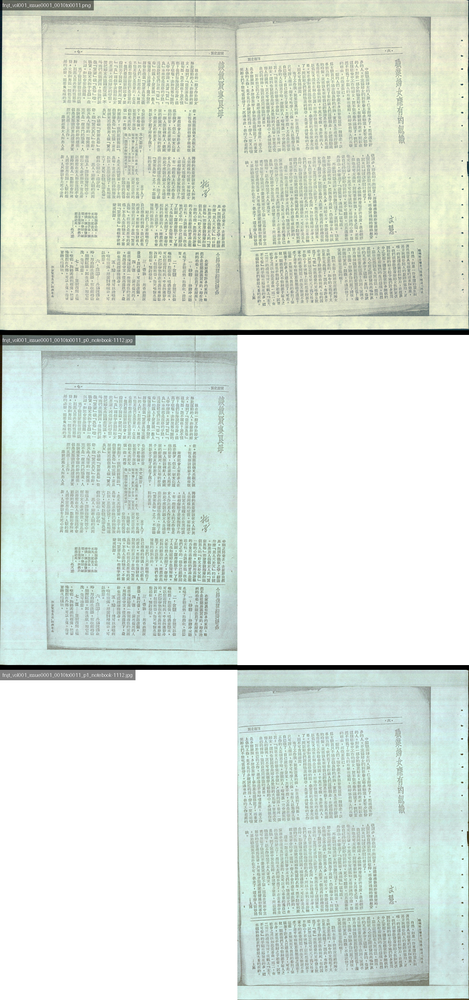

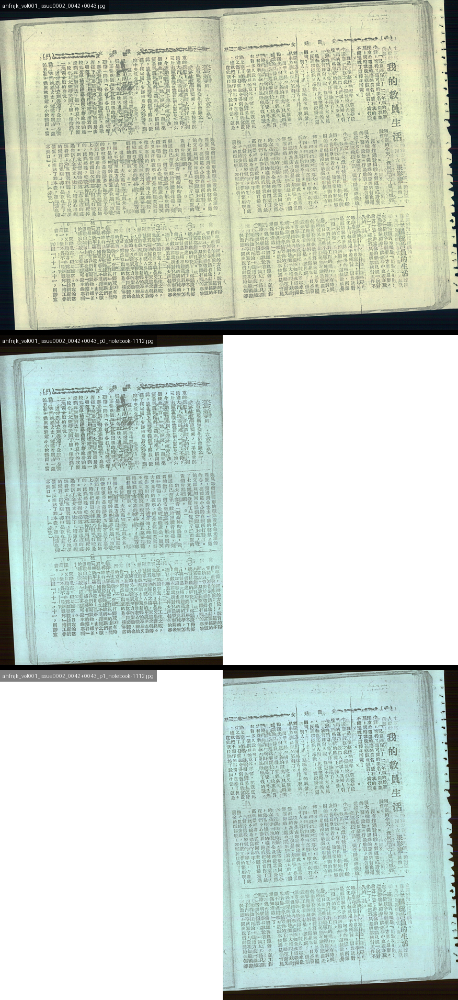

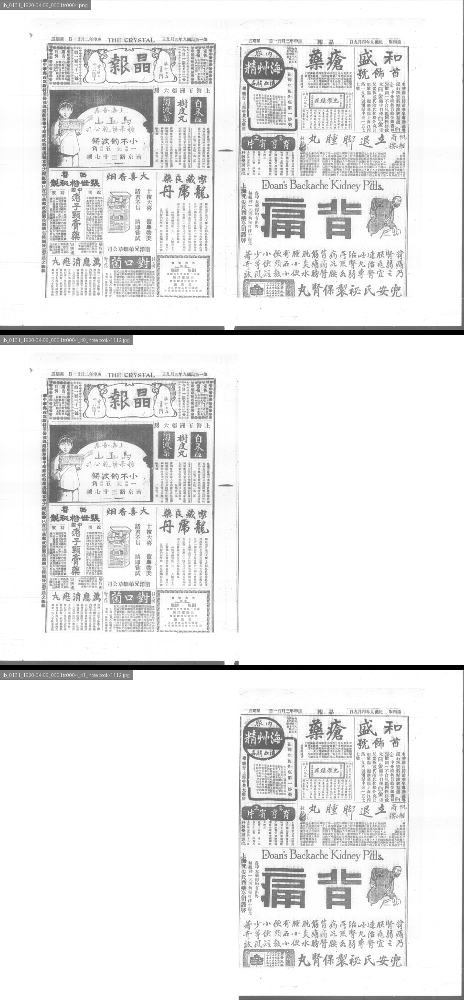

In [6]:
display_image(in_dir_2segs, out_dir_2segs) # the text overlay is not in the result images

### Debug info

In [7]:
# display debug info, e.g. for the first image
img_path_2segs = list(debug_info_2segs.keys())[0]
img_debug_info_2segs = debug_info_2segs[img_path_2segs]
mask_array_2segs = img_debug_info_2segs["mask_array"]
signal_2segs = img_debug_info_2segs["signal"]
org_bkps_2segs = img_debug_info_2segs["org_bkps"]
refined_bkps_2segs = img_debug_info_2segs["refined_bkps"]
fallback_2segs = img_debug_info_2segs["fallback"]

In [8]:
print(f"Image path: {img_path_2segs}")

Image path: ahfnjk_vol001_issue0002_0042+0043.jpg


In [9]:
print(f"Fallback used: {fallback_2segs}")

Fallback used: False


(<Figure size 1000x200 with 1 Axes>, [<Axes: >])

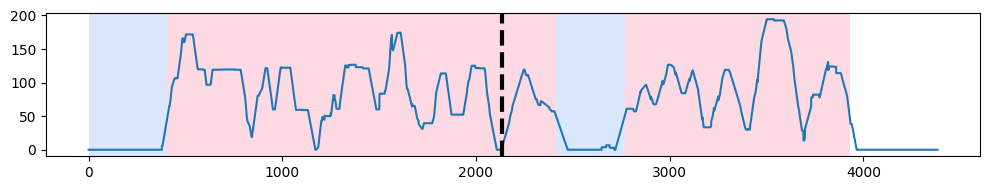

In [10]:
# signal and breakpoints visualization
rpt.display(signal_2segs, org_bkps_2segs, refined_bkps_2segs)

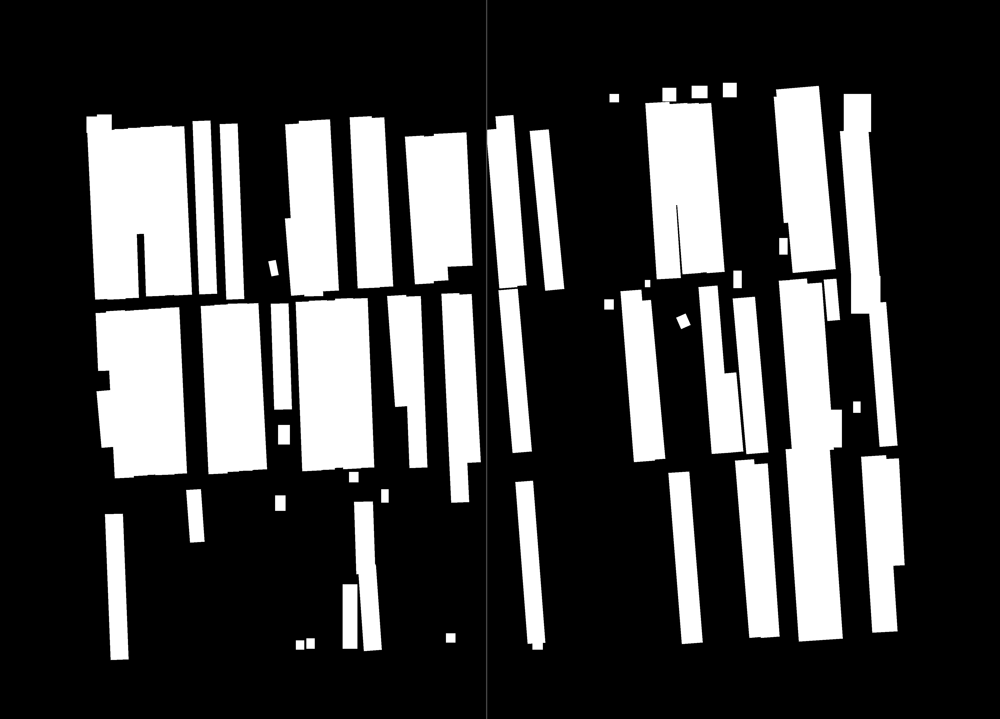

In [11]:
# mask array visualization
masked_image_2segs = Image.fromarray(mask_array_2segs)
draw = ImageDraw.Draw(masked_image_2segs)
for bkpt in refined_bkps_2segs:
    draw.line([(bkpt, 0), (bkpt, mask_array_2segs.shape[0])], fill="red", width=5)
masked_image_2segs

## Three-segment images

In [ ]:
# input and output folders
in_dir_3segs = Path("../../data/in/sample/3-segs")
out_dir_3segs = Path("../../data/out/pagesplit/3-segs")

In [ ]:
# use default config but modify input and output dirs
# default config is in ecpo_eynollah/config/default_config.json
new_config = {
    "input_dir": str(in_dir_3segs),
    "gutter_detection": {
        "output_dir": str(out_dir_3segs),
        "num_segments": 5, # change number of segments! For 3 segments, we use 5 here as usually there are 2 small segments on 2 sides of the gutter
        "gutter_size": 400,
    },
}

In [14]:
# split pages in the input folder and save to the output folder
debug_info_3segs = sp.process_folder(config_path="default", new_config=new_config, unique_tag="notebook-1112")

/home/tuyen/SSC_repos/ecpo-eynollah/ecpo_eynollah/config_handler.py:85: UserWarning: Key gutter_size not found in the config and will be skipped.
  warnings.warn(


The config have been saved to ../../data/out/pagesplit/3-segs/used_config_notebook-1112.json


files: 100%|██████████| 2/2 [00:24<00:00, 12.01s/it]

Processed 2 files.
Output saved to: ../../data/out/pagesplit/3-segs
Fallback to center split used in 0 files.


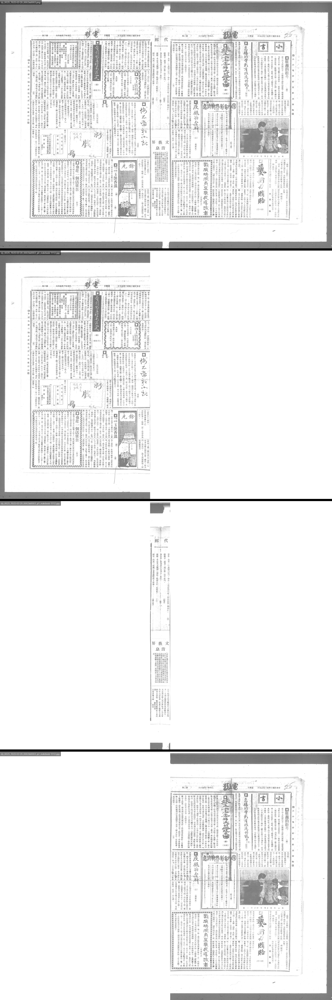

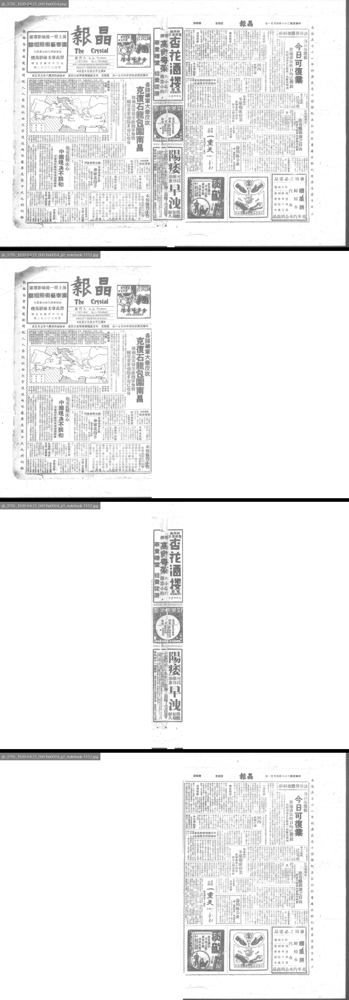

In [15]:
display_image(in_dir_3segs, out_dir_3segs) # the text overlay is not in the result images

### Debug info

In [16]:
# display debug info, e.g. for the second image
img_path_3segs = list(debug_info_3segs.keys())[1]
img_debug_info_3segs = debug_info_3segs[img_path_3segs]
mask_array_3segs = img_debug_info_3segs["mask_array"]
signal_3segs = img_debug_info_3segs["signal"]
org_bkps_3segs = img_debug_info_3segs["org_bkps"]
refined_bkps_3segs = img_debug_info_3segs["refined_bkps"]
fallback_3segs = img_debug_info_3segs["fallback"]

In [17]:
print(f"Image path: {img_path_3segs}")

Image path: jb_3795_1939-04-21_0001to0004.png


In [18]:
print(f"Fallback used: {fallback_3segs}")

Fallback used: False


(<Figure size 1000x200 with 1 Axes>, [<Axes: >])

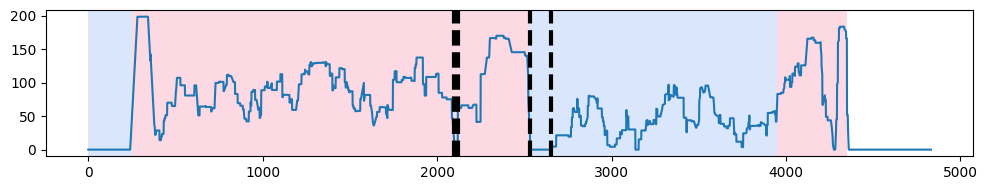

In [19]:
# signal and breakpoints visualization
rpt.display(signal_3segs, org_bkps_3segs, refined_bkps_3segs)

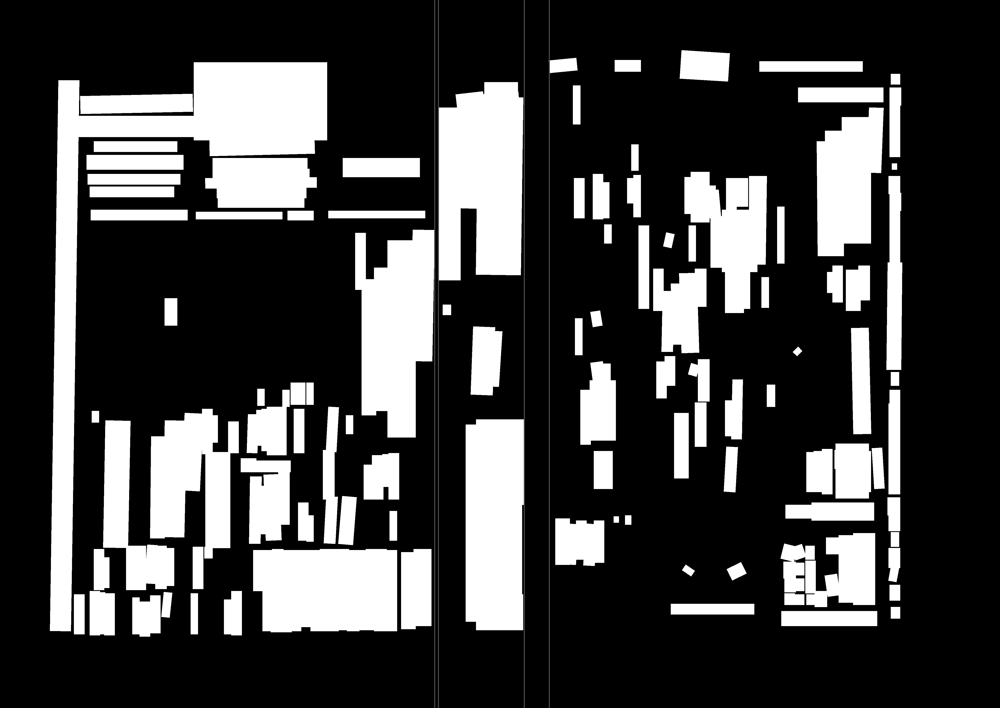

In [20]:
# mask array visualization
masked_image_3segs = Image.fromarray(mask_array_3segs)
draw = ImageDraw.Draw(masked_image_3segs)
for bkpt in refined_bkps_3segs:
    draw.line([(bkpt, 0), (bkpt, mask_array_3segs.shape[0])], fill="red", width=5)
masked_image_3segs